In [1]:
#Import packages 

import numpy as np 
import geopandas as gpd 
import matplotlib.pyplot as plt 
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors
import pandas as pd 
from shapely.geometry import shape 
import json 
from shapely import wkt 
from shapely.geometry import Point
from shapely.geometry import box
from math import cos, radians
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.cm import ScalarMappable
import seaborn as sns 
import matplotlib
from statsmodels.tsa.seasonal import seasonal_decompose
# import contextily as ctx
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans

import glob
import os
import csv
import ast
import matplotlib.patheffects as path_effects
from matplotlib.ticker import PercentFormatter

# from libpysal import weights

from matplotlib.colors import (
    ListedColormap,
    BoundaryNorm,
    LinearSegmentedColormap,
    TwoSlopeNorm
)

from pathlib import Path

In [2]:
DATA_DIR  = Path('../files')
PLOTS_DIR = Path('../outputs/plots')
PLOTS_DIR.mkdir(parents=True, exist_ok=True)
(PLOTS_DIR / 'supplementary').mkdir(exist_ok=True)
(PLOTS_DIR / 'spatial').mkdir(exist_ok=True)

### Read in source files 

In [3]:
# study area gdfs 
new_ea = gpd.read_file(DATA_DIR / 'miscellaneous/new_ea.json')
new_data_study_area = gpd.read_file(DATA_DIR / 'miscellaneous/new_data_study_area.json')

# PQR sites 
new_sites = gpd.read_file(DATA_DIR / 'miscellaneous/new_sites.json')

# shapefile (all EAs)
filt_all_eas_dem_df = gpd.read_file(DATA_DIR / 'miscellaneous/filt_all_eas_dem_df.json')

### Mapping of EAs and PQR sites 

In [4]:
ea_copy_pqr = new_ea.copy()
ea_copy_pqr = ea_copy_pqr[['ea_code9ch', 'geometry']]
merged_sites_pqr = gpd.sjoin(new_sites, ea_copy_pqr, how = 'inner', predicate = 'intersects')

merged_sites_pqr = merged_sites_pqr[['space_grouping', 'geometry', 'ea_code9ch']].reset_index(drop=True)

grouped_sites_df = merged_sites_pqr.groupby('ea_code9ch').agg({
    'space_grouping': lambda x: list(set(x)),  
})

grouped_sites_df = grouped_sites_df.rename(columns = {'space_grouping':'site_id'})

### 2021 Census Districts 

In [5]:
# read districts shapefile for plotting 
dist_2021 = gpd.read_file(DATA_DIR / 'miscellaneous/district_2021_census.geojson')

In [6]:
### Filter out Study Area Districts 

dist_2021 = gpd.sjoin(
    dist_2021, merged_sites_pqr.to_crs('EPSG:4326'), 
    how="inner", 
    predicate='contains' 
).reset_index(drop=True).drop(columns=['index_right'])

dist_2021 = dist_2021.drop_duplicates(['Name']).reset_index(drop=True)

# reproject to local CRS 
dist_2021_transformed = dist_2021.to_crs(merged_sites_pqr.crs)

district_gdf = dist_2021_transformed.copy()

### Revised EA shapefile  

In [7]:
filt_all_eas_dem_df_filt = gpd.sjoin(
    filt_all_eas_dem_df, dist_2021_transformed.drop(columns = ['ea_code9ch']), 
    how="inner", 
    predicate='intersects' 
).reset_index(drop=True)

## exclude additional EAs around the edges for basemap plotting 
additional_eas_to_exclude = [31400149, 31400142, 31400139, 31400134, 31400133, 30801173, 30801139, 30801138, 30801136, 30801063, 30801062, 30100656, 30100652, 30200407, 30200368, 30801041, 30801001, 30100689, 30200426]

filt_all_eas_dem_df_filt = filt_all_eas_dem_df_filt[
    ~filt_all_eas_dem_df_filt['ea_code9ch'].isin(additional_eas_to_exclude)
]

### EAs n Sites  (6km) 

In [8]:
merged_eas_sites = pd.read_csv(DATA_DIR / 'miscellaneous/ea_site_list_6km_buffer.csv')
merged_eas_sites = merged_eas_sites[['ea_code9ch', 'Intersecting_Sites']]

# Convert the string representation of lists to actual lists
merged_eas_sites['Intersecting_Sites'] = merged_eas_sites['Intersecting_Sites'].apply(ast.literal_eval)

### Read EAs and CESI level `rev_1`

In [9]:
eas_n_cesi_level = pd.read_csv(DATA_DIR / 'miscellaneous/eas_cesi_level_214_eas_rev1.csv').drop(columns = ['Unnamed: 0'])

### Merged sites & (214 EAs) 

In [10]:
merged_eas_sites = merged_eas_sites.merge(eas_n_cesi_level, on = 'ea_code9ch').reset_index(drop=True)

In [11]:
# merged_eas_sites

### Explode the site_ids 

In [12]:
merged_eas_sites_exploded = (
    merged_eas_sites
    .explode('Intersecting_Sites', ignore_index=True)
    .rename(columns={'Intersecting_Sites': 'site_id'})
)

merged_eas_sites_exploded['site_id'] = (merged_eas_sites_exploded['site_id'].astype('Int64'))

merged_eas_sites_exploded.head()

,ea_code9ch,site_id,cesi_level
0,30200002,456,Low
1,30200012,430,Low
2,30200013,363,Low
3,30200014,301,Low
4,30200015,104,Low


### filter & get site geometries from main `sample df` 

In [13]:
df = pd.read_csv(DATA_DIR / 'miscellaneous/2022-05-01.csv')

df = df[['time', 'respondent_id', 'site_latitude', 'site_longitude', 'voltage', 'frequency', 'site_id']]

In [14]:
site_coords = (
    df.groupby('site_id')[['site_latitude', 'site_longitude']]
      .first()
      .reset_index()
)

merged_df = merged_eas_sites_exploded.merge(
    site_coords,
    on='site_id',
    how='left'
)

In [15]:
merged_df.head()

,ea_code9ch,site_id,cesi_level,site_latitude,site_longitude
0,30200002,456,Low,5.633024,-0.300601
1,30200012,430,Low,5.638675,-0.300250
2,30200013,363,Low,5.640099,-0.291457
3,30200014,301,Low,5.636135,-0.286370
4,30200015,104,Low,5.644859,-0.290894


In [16]:
merged_df[merged_df['ea_code9ch'] == 30200263]

,ea_code9ch,site_id,cesi_level,site_latitude,site_longitude
34,30200263,351,Low,5.666025,-0.297281
35,30200263,231,Low,NaN,NaN


### read in 1- & 3-day overlap summary df 

In [17]:
ea_1_3_day_risk_flags = pd.read_csv(DATA_DIR / 'miscellaneous/ea_1_3_day_risk_flags.csv').drop(columns = ['Unnamed: 0'])

In [18]:
ea_1_3_day_risk_flags.head()

,ea_code9ch,event,one_day_risk,three_day_risk,both
0,30200126,L,0,1,0
1,30200184,L,0,1,0
2,30200198,L,1,0,0
3,30200204,L,0,1,0
4,30200266,L,1,0,0


### Merge with the EA & sites df 

In [19]:
merged_risk_df = (
    merged_df
    .merge(
        ea_1_3_day_risk_flags,
        on='ea_code9ch',
        how='left',
        validate='many_to_many'
    )
)

risk_cols = ['one_day_risk', 'three_day_risk', 'both']

merged_risk_df[risk_cols] = (
    merged_risk_df[risk_cols]
    .fillna(0)
    .astype(int)
)

In [20]:
merged_risk_df

,ea_code9ch,site_id,cesi_level,site_latitude,site_longitude,event,one_day_risk,three_day_risk,both
0,30200002,456,Low,5.633024,-0.300601,NaN,0,0,0
1,30200012,430,Low,5.638675,-0.300250,NaN,0,0,0
2,30200013,363,Low,5.640099,-0.291457,NaN,0,0,0
3,30200014,301,Low,5.636135,-0.286370,P,0,1,0
4,30200015,104,Low,5.644859,-0.290894,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...
251,31300310,117,Low,5.689682,-0.186315,W,1,0,0
252,31300328,296,Low,5.711324,-0.185577,NaN,0,0,0
253,31300407,445,Low,5.711772,-0.188362,NaN,0,0,0
254,31300449,228,Low,5.659560,-0.167445,NaN,0,0,0


In [21]:
merged_risk_df = merged_risk_df[['ea_code9ch', 'cesi_level', 'event', 'one_day_risk', 'three_day_risk', 'both']].reset_index(
                                                                                                drop=True)

merged_risk_df_w_geoms = merged_risk_df.merge(filt_all_eas_dem_df_filt[['ea_code9ch', 'geometry']], on = 'ea_code9ch', how = 'left').drop_duplicates(subset=['ea_code9ch', 'event'])
merged_risk_df_w_geoms = merged_risk_df_w_geoms.reset_index(drop=True)

merged_risk_gdf = gpd.GeoDataFrame(
    merged_risk_df_w_geoms.copy(),
    geometry="geometry",
    crs="EPSG:32630"
)

In [22]:
merged_risk_gdf

,ea_code9ch,cesi_level,event,one_day_risk,three_day_risk,both,geometry
0,30200002,Low,NaN,0,0,0,"POLYGON ((799017.814 623458.371, 799051.565 62..."
1,30200012,Low,NaN,0,0,0,"POLYGON ((799328.799 623914.862, 799292 623916..."
2,30200013,Low,NaN,0,0,0,"POLYGON ((799909.133 624452.948, 799919.44 624..."
3,30200014,Low,P,0,1,0,"POLYGON ((800503.736 624455.809, 800569.516 62..."
4,30200015,Low,NaN,0,0,0,"POLYGON ((799640.296 624891.197, 799654.316 62..."
...,...,...,...,...,...,...,...
224,31300291,High,NaN,0,0,0,"POLYGON ((813765.805 629305.242, 813853.337 62..."
225,31300310,Low,W,1,0,0,"POLYGON ((811832.487 629333.217, 811643.775 62..."
226,31300328,Low,NaN,0,0,0,"POLYGON ((813036.279 631092.941, 813016.813 63..."
227,31300407,Low,NaN,0,0,0,"POLYGON ((811220.071 632428, 811219.23 632385...."


## Visualize 

### Define x&y offsets, figsize, and x&y axis limits - so the spatial figures are more centered

In [23]:
common_x_ref_offset = 4     # km east if use_km=True
common_y_ref_offset = -1 

fig_size=(10, 8)

common_xlim = (-18, 18)
common_ylim = (-12, 22)

### EAs with increased outage odds during E.W 

In [24]:
eas_to_plot = filt_all_eas_dem_df_filt[['ea_code9ch', 'DIST_NAME', 'geometry', 'Pcode']].merge(eas_n_cesi_level, on = 'ea_code9ch', how = 'right').drop_duplicates(subset=['ea_code9ch']).reset_index(drop=True)

In [25]:
eas_to_plot

,ea_code9ch,DIST_NAME,geometry,Pcode,cesi_level
0,30200002,GA WEST,"POLYGON ((799017.814 623458.371, 799051.565 62...",03,Low
1,30200012,GA WEST,"POLYGON ((799328.799 623914.862, 799292 623916...",03,Low
2,30200013,GA WEST,"POLYGON ((799909.133 624452.948, 799919.44 624...",03,Low
3,30200014,GA WEST,"POLYGON ((800503.736 624455.809, 800569.516 62...",03,Low
4,30200015,GA WEST,"POLYGON ((799640.296 624891.197, 799654.316 62...",03,Low
...,...,...,...,...,...
209,31300291,LA NKWANANANG MADINA,"POLYGON ((813765.805 629305.242, 813853.337 62...",03,High
210,31300310,LA NKWANANANG MADINA,"POLYGON ((811832.487 629333.217, 811643.775 62...",03,Low
211,31300328,LA NKWANANANG MADINA,"POLYGON ((813036.279 631092.941, 813016.813 63...",03,Low
212,31300407,LA NKWANANANG MADINA,"POLYGON ((811220.071 632428, 811219.23 632385....",03,Low


In [26]:
increased_outage_odds_low_CESI = [30200067,
 30200109,
 30200134,
 30200153,
 30200198,
 30200207,
 30200266,
 30200273,
 30200275,
 30200283,
 30200292,
 30200295,
 30200299,
 30200397,
 30300002,
 30300068,
 30300069,
 30300123,
 30300396,
 30403015,
 30404053,
 30406001,
 30406057,
 30406139,
 30408058,
 30408062,
 30408101,
 30408124,
 30410044,
 30410046,
 30410121,
 30410197,
 30411066,
 30411069,
 30500065,
 30500074,
 30500085,
 30500167,
 30500175,
 30500185,
 31100027,
 31100210,
 31100216,
 31100223,
 31200008,
 31200045,
 31200076,
 31200113,
 31200166,
 31300178,
 31300310]

In [27]:
increased_outage_odds_high_CESI = [30200065,
 30200075,
 30200076,
 30200092,
 30200098,
 30200126,
 30402283,
 30403138,
 30407042,
 30407084,
 30410135,
 30410146,
 30410175,
 30410186,
 30410194,
 31300205,
 31300237,
 31300267]

In [28]:
# Ensure consistent EA-code types
high_cesi_eas = {str(x) for x in increased_outage_odds_high_CESI}
low_cesi_eas = {str(x) for x in increased_outage_odds_low_CESI}

base = filt_all_eas_dem_df_filt.copy()
eas_interest = eas_to_plot.copy()

base["ea_code9ch"] = base["ea_code9ch"].astype(str)
eas_interest["ea_code9ch"] = eas_interest["ea_code9ch"].astype(str)

# Separate plotting groups
high_cesi_interest = eas_interest[
    eas_interest["ea_code9ch"].isin(high_cesi_eas)
]

low_cesi_interest = eas_interest[
    eas_interest["ea_code9ch"].isin(low_cesi_eas)
]

other_interest = eas_interest[
    ~eas_interest["ea_code9ch"].isin(high_cesi_eas | low_cesi_eas)
]

In [29]:
new_ea_copy = new_ea.copy()[['ea_code9ch', 'BASE_NAM', 'LOC_NAME']]

In [30]:
new_ea_copy

,ea_code9ch,BASE_NAM,LOC_NAME
0,30500001,MERIDIAN STORE,TESA
1,30500002,ROGER BARBERING SHOP,TESA
2,30500003,MOTORWAY DAM,TESA
3,30500004,HSE # 18 ( OPPOSITE THE MAST),TESA
4,30500008,THE ANOINTED CHURCH,TESA / ADGIRIGANO
...,...,...,...
5014,31100511,GRAND PROVIDER GLOBAL SCHOOL,ANYAA
5015,31100560,ABLEKUMA: LIBERTY ACADEMY,ABLEKUMA
5016,31400041,CHURCH OF PENTECOST,KAKASUNANKA II
5017,30802130,DIVINE TOUCH CRECHE,TEMA COMMUNITY ONE


In [31]:
eas_to_plot = eas_to_plot.merge(new_ea_copy, on = 'ea_code9ch', how = 'inner')

### *** Inspecting the high-CESI clustered EAs 

In [32]:
high_cesi_eas_w_weather = eas_to_plot[eas_to_plot['ea_code9ch'].isin(increased_outage_odds_high_CESI)].reset_index(drop=True)

In [33]:
high_cesi_eas_w_weather = high_cesi_eas_w_weather.copy()

# Calculate polygon centroids
centroids = high_cesi_eas_w_weather.geometry.centroid

high_cesi_eas_w_weather["centroid_x"] = centroids.x
high_cesi_eas_w_weather["centroid_y"] = centroids.y

In [34]:
high_cesi_eas_w_weather

,ea_code9ch,DIST_NAME,geometry,Pcode,cesi_level,BASE_NAM,LOC_NAME,centroid_x,centroid_y
0,30200065,GA WEST,"POLYGON ((802936.258 621311.052, 802943.18 621...",03,High,TABORA: GOD'S GRACE ACADEMY,TABORA,802920.021797,621121.373457
1,30200075,GA WEST,"POLYGON ((802762.737 622271.414, 802772.154 62...",03,High,TABORA: ANKOFA ENGINEERING WORKS,TABORA,802878.027511,621948.200687
2,30200076,GA WEST,"POLYGON ((802213.069 622014.405, 802215.029 62...",03,High,TABORA: VICTORY WAY CHAPEL,TABORA,802424.277329,622179.137507
3,30200092,GA WEST,"POLYGON ((803761 621988.013, 803772.049 621983...",03,High,CHANTAN: FOUNTAIN OF FAITH MINISTRIES,CHANTAN,803618.529429,621887.891858
4,30200098,GA WEST,"POLYGON ((803962.527 622254.135, 804013.085 62...",03,High,CHANTAN: LYDIA SACKEY MEMORIAL ENTERPRISE,CHANTAN,804087.927903,622134.470546
5,30200126,GA WEST,"POLYGON ((804778.425 621723.097, 804804.652 62...",03,High,NII BOI TOWN: JONO ENTERPRISE,NII BOI TOWN,804793.026348,621616.672822
6,30402283,AMA-ABLEKUMA CENTRAL,"POLYGON ((806075.777 615669.44, 806048.853 615...",03,High,TAKORADI/CAPE COAST LORRY STATION,MATAHEKO,806067.964910,615865.188180
7,30403138,AMA-ASHIEDU KETEKE,"POLYGON ((808213.142 614015.974, 808194.465 61...",03,High,31ST_DECEMBER_MARKET,KORLE DUDOR,808017.523588,614435.677095
8,30407042,AMA-AYAWASO CENTRAL,"POLYGON ((808858.224 617848.034, 808911.314 61...",03,High,GROOVY PUB,NEW TOWN,808948.504205,617778.573133
9,30407084,AMA-AYAWASO CENTRAL,"POLYGON ((808347.896 619284.124, 808348.121 61...",03,High,MANDELA SPOT,ALAJO,808211.028531,619165.978235


In [35]:
filtered_gdf = high_cesi_eas_w_weather.loc[
    (high_cesi_eas_w_weather["centroid_y"] >= 620800)
    & (high_cesi_eas_w_weather["centroid_x"] <= 812000)
].copy().reset_index(drop=True)

In [36]:
filtered_gdf

,ea_code9ch,DIST_NAME,geometry,Pcode,cesi_level,BASE_NAM,LOC_NAME,centroid_x,centroid_y
0,30200065,GA WEST,"POLYGON ((802936.258 621311.052, 802943.18 621...",03,High,TABORA: GOD'S GRACE ACADEMY,TABORA,802920.021797,621121.373457
1,30200075,GA WEST,"POLYGON ((802762.737 622271.414, 802772.154 62...",03,High,TABORA: ANKOFA ENGINEERING WORKS,TABORA,802878.027511,621948.200687
2,30200076,GA WEST,"POLYGON ((802213.069 622014.405, 802215.029 62...",03,High,TABORA: VICTORY WAY CHAPEL,TABORA,802424.277329,622179.137507
3,30200092,GA WEST,"POLYGON ((803761 621988.013, 803772.049 621983...",03,High,CHANTAN: FOUNTAIN OF FAITH MINISTRIES,CHANTAN,803618.529429,621887.891858
4,30200098,GA WEST,"POLYGON ((803962.527 622254.135, 804013.085 62...",03,High,CHANTAN: LYDIA SACKEY MEMORIAL ENTERPRISE,CHANTAN,804087.927903,622134.470546
5,30200126,GA WEST,"POLYGON ((804778.425 621723.097, 804804.652 62...",03,High,NII BOI TOWN: JONO ENTERPRISE,NII BOI TOWN,804793.026348,621616.672822
6,30410135,AMA-OKAIKOI NORTH,"POLYGON ((806062.296 620993.824, 806024.886 62...",03,High,HEAVEN GATE,ACHIMOTA,806054.572869,621105.073028
7,30410146,AMA-OKAIKOI NORTH,"POLYGON ((806749.31 621682.676, 806731.41 6216...",03,High,EPP BOOKSHOP,ACHIMOTA,806802.920019,621722.231078
8,30410175,AMA-OKAIKOI NORTH,"POLYGON ((804468.932 620897, 804463.362 620882...",03,High,COSMOS PREP. SCH. DEPT.,NII BOI TOWN,804321.639797,620893.993474
9,30410186,AMA-OKAIKOI NORTH,"POLYGON ((805202.521 621185.763, 805190.784 62...",03,High,DON-MI YORK'S NEST,ACHIMOTA,805330.032143,621335.185596


### Read the same-day source file

In [37]:
same_day_summary_df = pd.read_csv(DATA_DIR / 'miscellaneous/summary_df_same_day_rev1.csv').drop(columns = ['Unnamed: 0'])

In [38]:
same_day_summary_df['ea_code9ch'] = same_day_summary_df['ea_code9ch'].astype('int64')
eas_n_cesi_level['ea_code9ch'] = eas_n_cesi_level['ea_code9ch'].astype('int64')

same_day_summary_df = same_day_summary_df.merge(
    eas_n_cesi_level,
    on='ea_code9ch'
)

In [39]:
same_day_summary_df

,ea_code9ch,event,odds_ratio,cesi_level
0,30200065,T,3.96,High
1,30200067,T,3.31,Low
2,30200075,T,2.21,High
3,30200076,T,4.23,High
4,30200092,T,3.09,High
...,...,...,...,...
69,31300178,P,3.15,Low
70,31300205,L,9.31,High
71,31300237,L,6.00,High
72,31300267,P,3.36,High


In [40]:
common_x_ref_offset = 4     # km east if use_km=True
common_y_ref_offset = -1 

fig_size=(10, 8)

common_xlim = (-18, 18)
common_ylim = (-12, 22)

### Visualize -- plot the centroids 

In [41]:
import geopandas as gpd
import matplotlib.pyplot as plt

from matplotlib.lines import Line2D
from shapely import affinity


def plot_same_day_outage_risk_relative(
    base_gdf,
    summary_df,
    event="T",
    ea_col="ea_code9ch",
    event_col="event",
    cesi_col="cesi_level",

    # Reference point
    use_union_centroid=True,
    ref_easting=None,
    ref_northing=None,
    x_ref_offset=0,
    y_ref_offset=0,
    use_km=True,

    # Background EA map
    show_basemap=False,
    basemap_facecolor="none",
    basemap_edgecolor="lightgrey",
    basemap_linewidth=0.4,
    basemap_alpha=1.0,

    # Centroid styling
    point_size=80,
    point_edgecolor="white",
    point_linewidth=0.8,
    point_marker="o",
    point_alpha=1.0,

    # Reference lines
    show_reference_lines=True,
    reference_linecolor="black",
    reference_linestyle="--",
    reference_linewidth=1,
    reference_alpha=0.5,

    # Reference point marker
    show_reference_point=False,
    reference_point_size=80,
    reference_point_marker="X",
    reference_point_color="black",

    # Figure and axes
    figsize=(10, 8),
    xlim=None,
    ylim=None,
    show_yaxis=True,

    # Axis labels
    x_label=None,
    y_label=None,
    axis_label_fontsize=15,
    axis_label_fontweight="bold",
    axis_labelpad=12,

    # Tick labels
    x_tick_fontsize=12,
    y_tick_fontsize=12,
    x_rotation=0,

    # Same colors as histogram
    cesi_colors={
        "Low": "tab:blue",
        "High": "tab:orange"
    },
    cesi_order=("Low", "High"),
    cesi_legend_labels={
        "Low": "Low CESI",
        "High": "High CESI"
    },

    # Panel label using ax.transAxes
    panel_label=None,
    panel_label_x=0.02,
    panel_label_y=0.98,
    panel_label_fontsize=16,
    panel_label_fontweight="bold",
    panel_label_ha="left",
    panel_label_va="top",

    # Legend
    show_legend=True,
    legend_title=None,
    legend_title_fontsize=12,
    legend_loc="upper left",
    legend_bbox=(0.60, 1.10),
    legend_fontsize=12,
    legend_marker_size=10,
    legend_frame=True,
    legend_facecolor="white",
    legend_edgecolor="grey",
    legend_framealpha=0.9,

    # Optional title
    title=None,
    title_fontsize=16,
    title_fontweight="bold",
    title_pad=15,

    # Output
    print_count=True,
    save_path=None,
    dpi=300
):
    """
    Plot centroids of EAs with increased same-day outage risk for a
    selected weather event.

    Locations are expressed as east-west and north-south distances
    from a common reference point. Centroid colors indicate CESI level.

    Duplicate EA polygon rows in base_gdf are dissolved so that each
    EA has one geometry and one centroid.
    """

    # -------------------------------------------------
    # Default CESI styling
    # -------------------------------------------------
    if cesi_colors is None:
        cesi_colors = {
            "Low": "#2878A5",
            "High": "#D62728"
        }

    if cesi_legend_labels is None:
        cesi_legend_labels = {
            "Low": "Low CESI",
            "High": "High CESI"
        }

    # -------------------------------------------------
    # Prepare input data
    # -------------------------------------------------
    base = gpd.GeoDataFrame(
        base_gdf.copy(),
        geometry="geometry",
        crs=base_gdf.crs
    )

    results = summary_df.copy()

    # Check CRS
    if base.crs is None:
        raise ValueError(
            "base_gdf must have a defined CRS."
        )

    if base.crs.is_geographic:
        raise ValueError(
            "base_gdf must use a projected CRS before calculating "
            "centroids and distances. For Greater Accra, you can use "
            "base_gdf.to_crs(epsg=32630)."
        )

    # Check required base columns
    required_base_columns = {
        ea_col,
        "geometry"
    }

    missing_base_columns = (
        required_base_columns - set(base.columns)
    )

    if missing_base_columns:
        raise ValueError(
            f"Missing columns in base_gdf: "
            f"{sorted(missing_base_columns)}"
        )

    # Check required results columns
    required_result_columns = {
        ea_col,
        event_col,
        cesi_col
    }

    missing_result_columns = (
        required_result_columns - set(results.columns)
    )

    if missing_result_columns:
        raise ValueError(
            f"Missing columns in summary_df: "
            f"{sorted(missing_result_columns)}"
        )

    # -------------------------------------------------
    # Clean and dissolve base geometries
    # -------------------------------------------------
    base = base.dropna(
        subset=[ea_col, "geometry"]
    ).copy()

    base = base[
        ~base.geometry.is_empty
    ].copy()

    # Standardize EA codes
    base[ea_col] = (
        base[ea_col]
        .astype(str)
        .str.strip()
    )

    # Combine duplicate polygon rows into one geometry per EA
    base = (
        base[[ea_col, "geometry"]]
        .dissolve(
            by=ea_col,
            as_index=False
        )
    )

    if not base[ea_col].is_unique:
        raise ValueError(
            "EA codes are still duplicated after dissolving."
        )

    # -------------------------------------------------
    # Clean results
    # -------------------------------------------------
    results = results.dropna(
        subset=[ea_col, event_col, cesi_col]
    ).copy()

    results[ea_col] = (
        results[ea_col]
        .astype(str)
        .str.strip()
    )

    results[event_col] = (
        results[event_col]
        .astype(str)
        .str.strip()
        .str.upper()
    )

    results[cesi_col] = (
        results[cesi_col]
        .astype(str)
        .str.strip()
        .str.title()
    )

    event = str(event).strip().upper()

    available_events = sorted(
        results[event_col].unique()
    )

    if event not in available_events:
        raise ValueError(
            f"Event '{event}' was not found. "
            f"Available events are: {available_events}"
        )

    # -------------------------------------------------
    # Select results for requested event
    # -------------------------------------------------
    event_results = results.loc[
        results[event_col].eq(event),
        [ea_col, cesi_col]
    ].copy()

    # Check whether an EA has conflicting CESI categories
    cesi_counts_per_ea = (
        event_results
        .groupby(ea_col)[cesi_col]
        .nunique()
    )

    conflicting_eas = (
        cesi_counts_per_ea[
            cesi_counts_per_ea > 1
        ]
        .index
        .tolist()
    )

    if conflicting_eas:
        raise ValueError(
            "Some EAs have more than one CESI category: "
            f"{conflicting_eas[:10]}"
        )

    # Keep one result row per EA
    event_results = (
        event_results
        .drop_duplicates(subset=[ea_col])
        .reset_index(drop=True)
    )

    # -------------------------------------------------
    # Join CESI categories to EA geometries
    # -------------------------------------------------
    event_interest = base.merge(
        event_results,
        on=ea_col,
        how="inner",
        validate="one_to_one"
    )

    event_interest = gpd.GeoDataFrame(
        event_interest,
        geometry="geometry",
        crs=base.crs
    )

    if event_interest.empty:
        raise ValueError(
            f"No matching EA geometries were found for event "
            f"'{event}'."
        )

    # -------------------------------------------------
    # Calculate EA centroids
    # -------------------------------------------------
    event_centroids = event_interest.copy()

    event_centroids["geometry"] = (
        event_interest.geometry.centroid
    )

    event_centroids["easting"] = (
        event_centroids.geometry.x
    )

    event_centroids["northing"] = (
        event_centroids.geometry.y
    )

    # -------------------------------------------------
    # Define common reference point
    # -------------------------------------------------
    if use_union_centroid:
        try:
            base_union = base.geometry.union_all()
        except Exception:
            base_union = base.geometry.unary_union

        reference_point = base_union.centroid

        ref_easting = reference_point.x
        ref_northing = reference_point.y

    else:
        if ref_easting is None or ref_northing is None:
            raise ValueError(
                "Provide both ref_easting and ref_northing when "
                "use_union_centroid=False."
            )

    # -------------------------------------------------
    # Apply reference offsets
    # -------------------------------------------------
    if use_km:
        ref_easting += x_ref_offset * 1000
        ref_northing += y_ref_offset * 1000

        conversion_factor = 1000
        unit_label = "km"

    else:
        ref_easting += x_ref_offset
        ref_northing += y_ref_offset

        conversion_factor = 1
        unit_label = "m"

    # -------------------------------------------------
    # Calculate coordinates relative to reference
    # -------------------------------------------------
    event_centroids["x_distance"] = (
        event_centroids["easting"] - ref_easting
    ) / conversion_factor

    event_centroids["y_distance"] = (
        event_centroids["northing"] - ref_northing
    ) / conversion_factor

    # -------------------------------------------------
    # Diagnostics
    # -------------------------------------------------
    if print_count:
        print(
            f"{event} EA centroids plotted: "
            f"{event_centroids[ea_col].nunique()}"
        )

        print("\nCESI counts:")

        print(
            event_centroids[cesi_col]
            .value_counts()
            .reindex(
                cesi_order,
                fill_value=0
            )
        )

        print(
            f"\nReference offset: "
            f"x={x_ref_offset} {unit_label}, "
            f"y={y_ref_offset} {unit_label}"
        )

    # -------------------------------------------------
    # Create figure
    # -------------------------------------------------
    fig, ax = plt.subplots(
        figsize=figsize
    )

    # -------------------------------------------------
    # Optional relative-coordinate EA basemap
    # -------------------------------------------------
    if show_basemap:
        relative_base = base.copy()

        relative_base["geometry"] = (
            relative_base.geometry.apply(
                lambda geom: affinity.scale(
                    affinity.translate(
                        geom,
                        xoff=-ref_easting,
                        yoff=-ref_northing
                    ),
                    xfact=1 / conversion_factor,
                    yfact=1 / conversion_factor,
                    origin=(0, 0)
                )
            )
        )

        relative_base.plot(
            ax=ax,
            facecolor=basemap_facecolor,
            edgecolor=basemap_edgecolor,
            linewidth=basemap_linewidth,
            alpha=basemap_alpha,
            zorder=1
        )

    # -------------------------------------------------
    # Plot EA centroids by CESI category
    # -------------------------------------------------
    observed_levels = list(
        event_centroids[cesi_col]
        .dropna()
        .unique()
    )

    ordered_observed_levels = [
        level
        for level in cesi_order
        if level in observed_levels
    ]

    unexpected_levels = [
        level
        for level in observed_levels
        if level not in cesi_order
    ]

    plot_levels = (
        ordered_observed_levels
        + unexpected_levels
    )

    for cesi_level in plot_levels:
        cesi_subset = event_centroids[
            event_centroids[cesi_col].eq(
                cesi_level
            )
        ]

        ax.scatter(
            cesi_subset["x_distance"],
            cesi_subset["y_distance"],
            s=point_size,
            c=cesi_colors.get(
                cesi_level,
                "#7F7F7F"
            ),
            marker=point_marker,
            edgecolors=point_edgecolor,
            linewidths=point_linewidth,
            alpha=point_alpha,
            zorder=3
        )

    # -------------------------------------------------
    # Reference lines
    # -------------------------------------------------
    if show_reference_lines:
        ax.axhline(
            0,
            color=reference_linecolor,
            linestyle=reference_linestyle,
            linewidth=reference_linewidth,
            alpha=reference_alpha,
            zorder=2
        )

        ax.axvline(
            0,
            color=reference_linecolor,
            linestyle=reference_linestyle,
            linewidth=reference_linewidth,
            alpha=reference_alpha,
            zorder=2
        )

    # -------------------------------------------------
    # Reference point
    # -------------------------------------------------
    if show_reference_point:
        ax.scatter(
            0,
            0,
            s=reference_point_size,
            c=reference_point_color,
            marker=reference_point_marker,
            zorder=4
        )

    # -------------------------------------------------
    # Panel label using ax.transAxes
    # -------------------------------------------------
    if panel_label is not None:
        ax.text(
            panel_label_x,
            panel_label_y,
            str(panel_label),
            transform=ax.transAxes,
            fontsize=panel_label_fontsize,
            fontweight=panel_label_fontweight,
            horizontalalignment=panel_label_ha,
            verticalalignment=panel_label_va,
            clip_on=False,
            zorder=10
        )

    # -------------------------------------------------
    # Axis labels
    # -------------------------------------------------
    if x_label is None:
        x_label = (
            f"East–West distance from reference "
            f"({unit_label})"
        )

    if y_label is None:
        y_label = (
            f"North–South distance from reference "
            f"({unit_label})"
        )

    ax.set_xlabel(
        x_label,
        fontsize=axis_label_fontsize,
        fontweight=axis_label_fontweight,
        labelpad=axis_labelpad
    )

    ax.set_ylabel(
        y_label,
        fontsize=axis_label_fontsize,
        fontweight=axis_label_fontweight,
        labelpad=axis_labelpad
    )

    # -------------------------------------------------
    # Axis ticks
    # -------------------------------------------------
    ax.tick_params(
        axis="x",
        labelsize=x_tick_fontsize,
        labelrotation=x_rotation
    )

    ax.tick_params(
        axis="y",
        labelsize=y_tick_fontsize
    )

    # Hide y-axis if requested
    if not show_yaxis:
        ax.yaxis.set_visible(False)
        ax.spines["left"].set_visible(False)

    # Axis limits
    if xlim is not None:
        ax.set_xlim(xlim)

    if ylim is not None:
        ax.set_ylim(ylim)

    # Preserve spatial proportions
    ax.set_aspect(
        "equal",
        adjustable="box"
    )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # -------------------------------------------------
    # CESI-only legend
    # -------------------------------------------------
    if show_legend:
        legend_handles = [
            Line2D(
                [0],
                [0],
                marker=point_marker,
                linestyle="none",
                markerfacecolor=cesi_colors.get(
                    level,
                    "#7F7F7F"
                ),
                markeredgecolor=point_edgecolor,
                markeredgewidth=point_linewidth,
                markersize=legend_marker_size,
                label=cesi_legend_labels.get(
                    level,
                    level
                )
            )
            for level in plot_levels
        ]

        ax.legend(
            handles=legend_handles,
            title=legend_title,
            loc=legend_loc,
            bbox_to_anchor=legend_bbox,
            frameon=legend_frame,
            facecolor=legend_facecolor,
            edgecolor=legend_edgecolor,
            framealpha=legend_framealpha,
            fontsize=legend_fontsize,
            title_fontsize=legend_title_fontsize
        )

    # -------------------------------------------------
    # Optional title
    # -------------------------------------------------
    if title is not None:
        ax.set_title(
            title,
            fontsize=title_fontsize,
            fontweight=title_fontweight,
            pad=title_pad
        )

    plt.tight_layout()

    # -------------------------------------------------
    # Optional save
    # -------------------------------------------------
    if save_path is not None:
        plt.savefig(
            save_path,
            dpi=dpi,
            bbox_inches="tight"
        )

    plt.show()

    return fig, ax, event_centroids

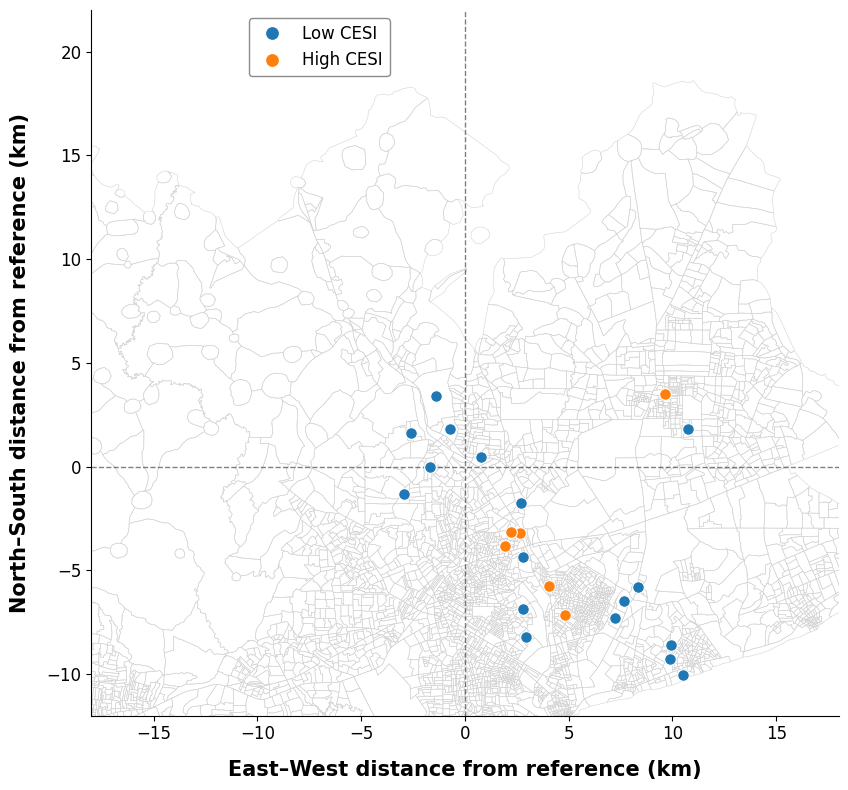

In [42]:
fig, ax, precipitation_centroids = (
    plot_same_day_outage_risk_relative(
        base_gdf=filt_all_eas_dem_df_filt,
        summary_df=same_day_summary_df,
        event="P",
        print_count=False, 

        use_union_centroid=True,
        use_km=True,
        x_ref_offset=common_x_ref_offset,
        y_ref_offset=common_y_ref_offset,

        show_yaxis=True,
        show_basemap=True,

        # CESI styling
        cesi_colors={
            "Low": "tab:blue",
            "High": "tab:orange"
        },
        cesi_order=("Low", "High"),
        cesi_legend_labels={
            "Low": "Low CESI",
            "High": "High CESI"
        },

        point_size=70,
        point_edgecolor="white",
        point_linewidth=0.8,

        # Panel label
        panel_label="",
        panel_label_x=-0.01,
        panel_label_y=1.06,
        panel_label_fontsize=16,

        # Legend
        legend_title=None,
        legend_loc="upper left",
        legend_bbox=(0.20, 1.00),
        legend_fontsize=12,

        figsize=fig_size,
        xlim=common_xlim,
        ylim=common_ylim, 

        # Save figure
        # save_path=PLOTS_DIR / "elevated_risk_by_CESI_Lightning_basemap.png",
        dpi=300
    )
)

In [43]:
## focus on P 
## not disaggregating by CESI level 
## coloring by outage odds 

## then, add the basemap 

In [44]:
p_summary = same_day_summary_df[same_day_summary_df['event'] == 'P'].reset_index(drop=True)

In [45]:
p_summary.sort_values(by = 'odds_ratio')

,ea_code9ch,event,odds_ratio,cesi_level
12,30408101,P,2.29,Low
13,30410046,P,2.50,Low
9,30407042,P,2.85,High
1,30200273,P,2.92,Low
18,31200076,P,2.93,Low
21,31300178,P,3.15,Low
3,30200295,P,3.22,Low
11,30408058,P,3.27,Low
0,30200207,P,3.29,Low
22,31300267,P,3.36,High


In [46]:
### Inspect divisions 

In [47]:
precip_odds = (
    same_day_summary_df[
        same_day_summary_df['event'].eq('P')
    ]
    .copy()
)


precip_odds['odds_category'] = pd.cut(
    precip_odds['odds_ratio'],
    bins=[2, 3, 4, 6, np.inf],
    labels=[
        '2–3',
        '3–4',
        '4–6',
        '≥6'
    ],
    right=False,
    include_lowest=True
)


precip_odds['odds_category'].value_counts(sort=False)

odds_category
2–3    5
3–4    8
4–6    9
≥6     1
Name: count, dtype: int64

In [53]:
def plot_same_day_outage_odds_categories_map(
    base_gdf,
    summary_df,
    event="P",
    ea_col="ea_code9ch",
    event_col="event",
    odds_col="odds_ratio",

    # Odds-ratio categories
    odds_bins=(2, 3, 4, 6, float("inf")),
    odds_labels=("2–<3", "3–<4", "4–<6", "≥6"),
    odds_colors=None,

    # Figure
    figsize=(10, 8),
    dpi=300,

    # Point styling
    point_size=70,
    point_alpha=1.0,
    point_marker="o",
    point_edgecolor="white",
    point_linewidth=0.8,

    # Individual EA styling
    ea_facecolor="none",
    ea_alpha=0.60,
    ea_edgecolor="black",
    ea_linewidth=0.35,

    # Unionized study-area boundary
    union_facecolor="none",
    union_alpha=1.0,
    union_edgecolor="black",
    union_linewidth=1.5,

    # Contextily basemap
    show_contextily=True,
    tile_source=None,
    tile_zoom="auto",
    tile_attribution=None,
    attribution_size=6,

    # Optional map extent in the projected CRS
    xlim=None,
    ylim=None,
    show_axes=False,

    # Panel label
    panel_label=None,
    panel_label_x=-0.01,
    panel_label_y=1.02,
    panel_label_fontsize=16,
    panel_label_fontweight="bold",

    # Legend
    show_legend=True,
    legend_title="Outage odds ratio",
    legend_title_fontsize=12,
    legend_loc="upper left",
    legend_bbox=None,
    legend_fontsize=11,
    legend_marker_size=10,
    legend_frame=True,
    legend_facecolor="white",
    legend_edgecolor="grey",
    legend_framealpha=0.9,

    # Optional title and output
    title=None,
    title_fontsize=16,
    title_fontweight="bold",
    title_pad=15,
    print_count=True,
    save_path=None
):
    """
    Plot event-filtered EA centroids in categorical odds-ratio classes.

    The map uses the projected CRS of base_gdf directly. No relative
    coordinates, reference centroid, distance conversion, or reference
    lines are used. xlim and ylim, when supplied, must use the same CRS.
    """

    import numpy as np
    import pandas as pd
    import geopandas as gpd
    import matplotlib.pyplot as plt

    from matplotlib.lines import Line2D

    # -------------------------------------------------
    # Defaults and category validation
    # -------------------------------------------------
    if odds_colors is None:
        odds_colors = {
            "2–<3": "#fed976",
            "3–<4": "#fd8d3c",
            "4–<6": "#e31a1c",
            "≥6": "#800026"
        }

    if len(odds_bins) != len(odds_labels) + 1:
        raise ValueError(
            "odds_bins must have exactly one more element than odds_labels."
        )

    missing_color_labels = set(odds_labels) - set(odds_colors)
    if missing_color_labels:
        raise ValueError(
            "odds_colors is missing these labels: "
            f"{sorted(missing_color_labels)}"
        )

    category_colors = {
        label: odds_colors[label]
        for label in odds_labels
    }

    # -------------------------------------------------
    # Prepare EA polygons
    # -------------------------------------------------
    base = gpd.GeoDataFrame(
        base_gdf.copy(),
        geometry="geometry",
        crs=base_gdf.crs
    )

    if base.crs is None:
        raise ValueError("base_gdf must have a defined CRS.")

    if base.crs.is_geographic:
        raise ValueError(
            "base_gdf must use a projected CRS, such as EPSG:32630."
        )

    missing_base_columns = {ea_col, "geometry"} - set(base.columns)
    if missing_base_columns:
        raise ValueError(
            f"Missing columns in base_gdf: {sorted(missing_base_columns)}"
        )

    base = base.dropna(subset=[ea_col, "geometry"]).copy()
    base = base[
        ~base.geometry.is_empty & base.geometry.is_valid
    ].copy()
    base[ea_col] = base[ea_col].astype(str).str.strip()

    # One geometry per EA
    base = (
        base[[ea_col, "geometry"]]
        .dissolve(by=ea_col, as_index=False)
    )

    if base.empty:
        raise ValueError("No valid EA geometries were found.")

    # Unionized exterior study-area boundary
    try:
        union_geometry = base.geometry.union_all()
    except AttributeError:
        union_geometry = base.geometry.unary_union

    union_gdf = gpd.GeoDataFrame(
        {"geometry": [union_geometry]},
        crs=base.crs
    )

    # -------------------------------------------------
    # Filter and classify event results
    # -------------------------------------------------
    results = summary_df.copy()
    missing_result_columns = {
        ea_col, event_col, odds_col
    } - set(results.columns)

    if missing_result_columns:
        raise ValueError(
            "Missing columns in summary_df: "
            f"{sorted(missing_result_columns)}"
        )

    results = results.dropna(
        subset=[ea_col, event_col, odds_col]
    ).copy()
    results[ea_col] = results[ea_col].astype(str).str.strip()
    results[event_col] = (
        results[event_col]
        .astype(str)
        .str.strip()
        .str.upper()
    )
    results[odds_col] = pd.to_numeric(
        results[odds_col], errors="coerce"
    )
    results = results[np.isfinite(results[odds_col])].copy()

    event = str(event).strip().upper()
    available_events = sorted(results[event_col].unique())

    if event not in available_events:
        raise ValueError(
            f"Event '{event}' was not found. "
            f"Available events are: {available_events}"
        )

    event_results = results.loc[
        results[event_col].eq(event),
        [ea_col, odds_col]
    ].copy()

    duplicated_eas = event_results.loc[
        event_results.duplicated(ea_col, keep=False),
        ea_col
    ].unique()

    if len(duplicated_eas) > 0:
        raise ValueError(
            "Each EA must have one odds ratio per event. Duplicate EAs: "
            f"{duplicated_eas[:10].tolist()}"
        )

    event_results["odds_category"] = pd.cut(
        event_results[odds_col],
        bins=list(odds_bins),
        labels=list(odds_labels),
        right=False,
        include_lowest=True
    )

    outside_bins = event_results[
        event_results["odds_category"].isna()
    ]

    if not outside_bins.empty:
        outside_values = sorted(outside_bins[odds_col].unique())
        raise ValueError(
            "Some odds ratios fall outside odds_bins: "
            f"{outside_values[:10]}"
        )

    # -------------------------------------------------
    # Join results to EAs and calculate true CRS centroids
    # -------------------------------------------------
    event_interest = base.merge(
        event_results,
        on=ea_col,
        how="inner",
        validate="one_to_one"
    )

    event_interest = gpd.GeoDataFrame(
        event_interest,
        geometry="geometry",
        crs=base.crs
    )

    if event_interest.empty:
        raise ValueError(
            f"No matching EA geometries were found for event '{event}'."
        )

    event_centroids = event_interest.copy()
    event_centroids["geometry"] = event_interest.geometry.centroid
    event_centroids["easting"] = event_centroids.geometry.x
    event_centroids["northing"] = event_centroids.geometry.y

    # -------------------------------------------------
    # Create map
    # -------------------------------------------------
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    # Individual EA polygons establish the map extent
    base.plot(
        ax=ax,
        facecolor=ea_facecolor,
        alpha=ea_alpha,
        edgecolor=ea_edgecolor,
        linewidth=ea_linewidth,
        zorder=2
    )

    # Thick unionized exterior boundary
    union_gdf.plot(
        ax=ax,
        facecolor=union_facecolor,
        alpha=union_alpha,
        edgecolor=union_edgecolor,
        linewidth=union_linewidth,
        zorder=3
    )

    if xlim is not None:
        if len(xlim) != 2:
            raise ValueError("xlim must contain exactly two values.")
        ax.set_xlim(xlim)

    if ylim is not None:
        if len(ylim) != 2:
            raise ValueError("ylim must contain exactly two values.")
        ax.set_ylim(ylim)

    # Contextily tiles behind the vector layers
    if show_contextily:
        try:
            import contextily as ctx
        except ImportError as exc:
            raise ImportError(
                "Install contextily with: "
                "conda install -c conda-forge contextily"
            ) from exc

        if tile_source is None:
            tile_source = ctx.providers.Esri.WorldGrayCanvas

        ctx.add_basemap(
            ax,
            crs=base.crs,
            source=tile_source,
            zoom=tile_zoom,
            attribution=tile_attribution,
            attribution_size=attribution_size,
            zorder=1
        )

    # Event centroids by odds-ratio class
    for category in odds_labels:
        subset = event_centroids[
            event_centroids["odds_category"] == category
        ]

        if subset.empty:
            continue

        ax.scatter(
            subset.geometry.x,
            subset.geometry.y,
            s=point_size,
            c=category_colors[category],
            marker=point_marker,
            edgecolors=point_edgecolor,
            linewidths=point_linewidth,
            alpha=point_alpha,
            zorder=4
        )

    # -------------------------------------------------
    # Legend
    # -------------------------------------------------
    if show_legend:
        observed_categories = set(
            event_centroids["odds_category"].dropna().astype(str)
        )

        legend_handles = [
            Line2D(
                [0],
                [0],
                marker=point_marker,
                linestyle="none",
                markerfacecolor=category_colors[label],
                markeredgecolor=point_edgecolor,
                markeredgewidth=point_linewidth,
                markersize=legend_marker_size,
                label=label
            )
            for label in odds_labels
            if label in observed_categories
        ]

        legend_kwargs = {
            "handles": legend_handles,
            "title": legend_title,
            "loc": legend_loc,
            "fontsize": legend_fontsize,
            "title_fontsize": legend_title_fontsize,
            "frameon": legend_frame,
            "facecolor": legend_facecolor,
            "edgecolor": legend_edgecolor,
            "framealpha": legend_framealpha
        }

        if legend_bbox is not None:
            legend_kwargs["bbox_to_anchor"] = legend_bbox

        ax.legend(**legend_kwargs)

    # -------------------------------------------------
    # Labels and output
    # -------------------------------------------------
    if panel_label is not None:
        ax.text(
            panel_label_x,
            panel_label_y,
            str(panel_label),
            transform=ax.transAxes,
            fontsize=panel_label_fontsize,
            fontweight=panel_label_fontweight,
            ha="left",
            va="bottom",
            clip_on=False,
            zorder=10
        )

    if title is not None:
        ax.set_title(
            title,
            fontsize=title_fontsize,
            fontweight=title_fontweight,
            pad=title_pad
        )

    ax.set_aspect("equal", adjustable="box")

    if not show_axes:
        ax.set_axis_off()

    plt.tight_layout()

    if save_path is not None:
        fig.savefig(save_path, dpi=dpi, bbox_inches="tight")

    if print_count:
        print(f"{event} EA centroids plotted: {len(event_centroids)}")
        print("\nOdds-ratio category counts:")
        print(
            event_centroids["odds_category"]
            .value_counts(sort=False)
            .reindex(odds_labels, fill_value=0)
        )

    plt.show()

    return fig, ax, event_centroids

In [ ]:
odds_colors = {
    '2–<3': '#fed976',
    '3–<4': '#fd8d3c',
    '4–<6': '#e31a1c',
    '≥6': '#800026'
}


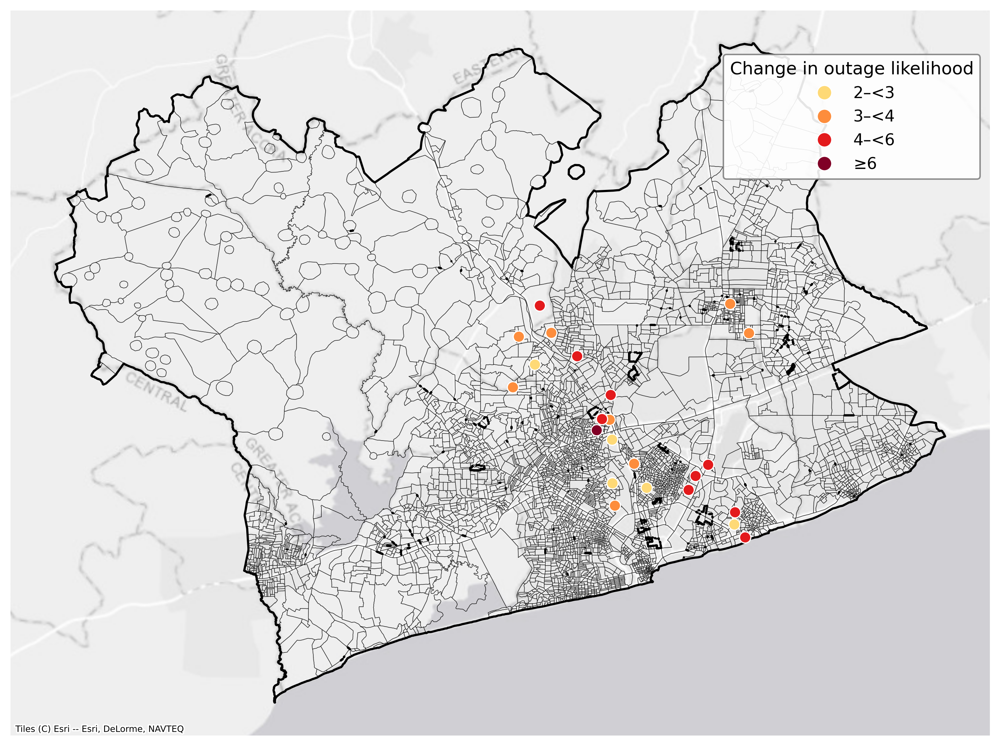

In [57]:
fig, ax, precipitation_centroids = (
    plot_same_day_outage_odds_categories_map(
        base_gdf=filt_all_eas_dem_df_filt,
        summary_df=same_day_summary_df,

        # Event and columns
        event='P',
        ea_col='ea_code9ch',
        event_col='event',
        odds_col='odds_ratio',

        # Odds-ratio categories
        odds_bins=(
            2,
            3,
            4,
            6,
            float('inf')
        ),
        odds_labels=(
            '2–<3',
            '3–<4',
            '4–<6',
            '≥6'
        ),
        odds_colors=odds_colors,

        # Figure
        figsize=fig_size,
        dpi=300,

        # Points
        point_size=60,
        point_alpha=1.0,
        point_marker='o',
        point_edgecolor='white',
        point_linewidth=0.8,

        # Individual EAs
        ea_facecolor='none',
        ea_alpha=0.60,
        ea_edgecolor='black',
        ea_linewidth=0.35,

        # Unionized EA boundary
        union_facecolor='none',
        union_alpha=1.0,
        union_edgecolor='black',
        union_linewidth=1.5,

        # Contextily basemap
        show_contextily=True,
        tile_source=ctx.providers.Esri.WorldGrayCanvas,
        tile_zoom='auto',
        tile_attribution=None,
        attribution_size=6,

        # Hide projected-coordinate axes
        show_axes=False,

        # Panel label
        panel_label=None,

        # Legend
        show_legend=True,
        legend_title='Change in outage likelihood',
        legend_title_fontsize=12,
        legend_loc='upper left',
        legend_bbox=(0.72, 0.95),
        legend_fontsize=11,
        legend_marker_size=10,
        legend_frame=True,
        legend_facecolor='white',
        legend_edgecolor='grey',
        legend_framealpha=0.9,

        # Diagnostics
        print_count=False,

        # Output
        # save_path=(
        #     PLOTS_DIR /
        #     'precipitation_outage_odds_categories_poster.png'
        # )
    )
)

In [59]:
odds_colors = {
    '2–<3': '#c6dbef',
    '3–<4': '#6baed6',
    '4–<6': '#2171b5',
    '≥6': '#08306b'
}

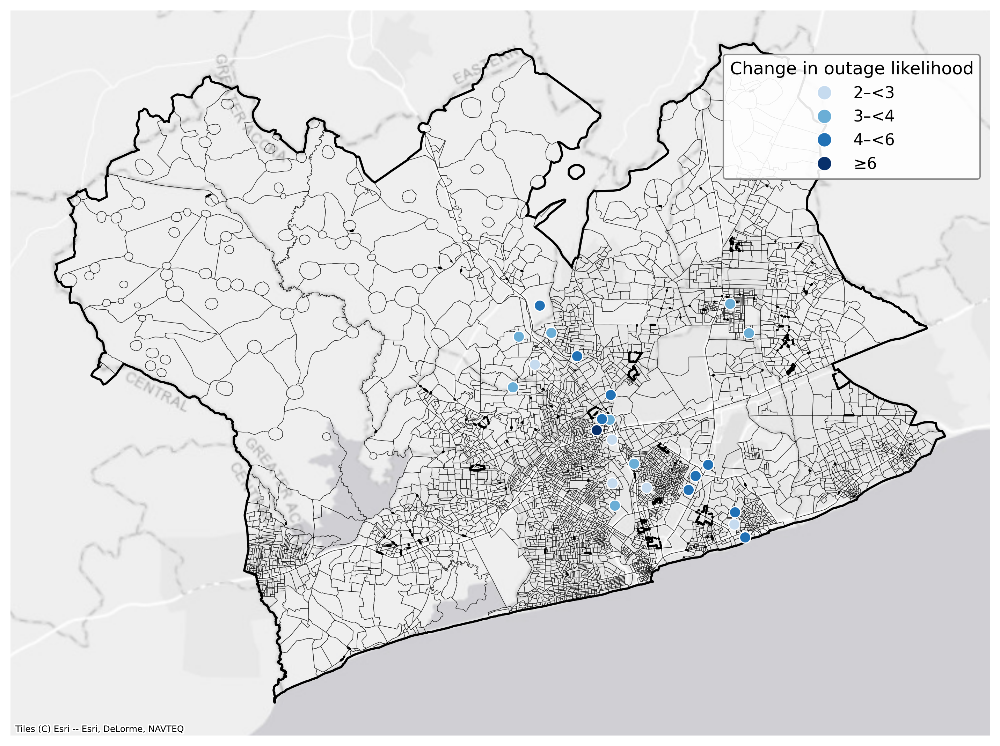

In [60]:
fig, ax, precipitation_centroids = (
    plot_same_day_outage_odds_categories_map(
        base_gdf=filt_all_eas_dem_df_filt,
        summary_df=same_day_summary_df,

        # Event and columns
        event='P',
        ea_col='ea_code9ch',
        event_col='event',
        odds_col='odds_ratio',

        # Odds-ratio categories
        odds_bins=(
            2,
            3,
            4,
            6,
            float('inf')
        ),
        odds_labels=(
            '2–<3',
            '3–<4',
            '4–<6',
            '≥6'
        ),
        odds_colors=odds_colors,

        # Figure
        figsize=fig_size,
        dpi=300,

        # Points
        point_size=60,
        point_alpha=1.0,
        point_marker='o',
        point_edgecolor='white',
        point_linewidth=0.8,

        # Individual EAs
        ea_facecolor='none',
        ea_alpha=0.60,
        ea_edgecolor='black',
        ea_linewidth=0.35,

        # Unionized EA boundary
        union_facecolor='none',
        union_alpha=1.0,
        union_edgecolor='black',
        union_linewidth=1.5,

        # Contextily basemap
        show_contextily=True,
        tile_source=ctx.providers.Esri.WorldGrayCanvas,
        tile_zoom='auto',
        tile_attribution=None,
        attribution_size=6,

        # Hide projected-coordinate axes
        show_axes=False,

        # Panel label
        panel_label=None,

        # Legend
        show_legend=True,
        legend_title='Change in outage likelihood',
        legend_title_fontsize=12,
        legend_loc='upper left',
        legend_bbox=(0.72, 0.95),
        legend_fontsize=11,
        legend_marker_size=10,
        legend_frame=True,
        legend_facecolor='white',
        legend_edgecolor='grey',
        legend_framealpha=0.9,

        # Diagnostics
        print_count=False,

        # Output
        # save_path=(
        #     PLOTS_DIR /
        #     'precipitation_outage_odds_categories_poster.png'
        # )
    )
)

In [61]:
odds_colors = {
    '2–<3': '#bfd3e6',
    '3–<4': '#9ebcda',
    '4–<6': '#8c6bb1',
    '≥6': '#4d004b'
}

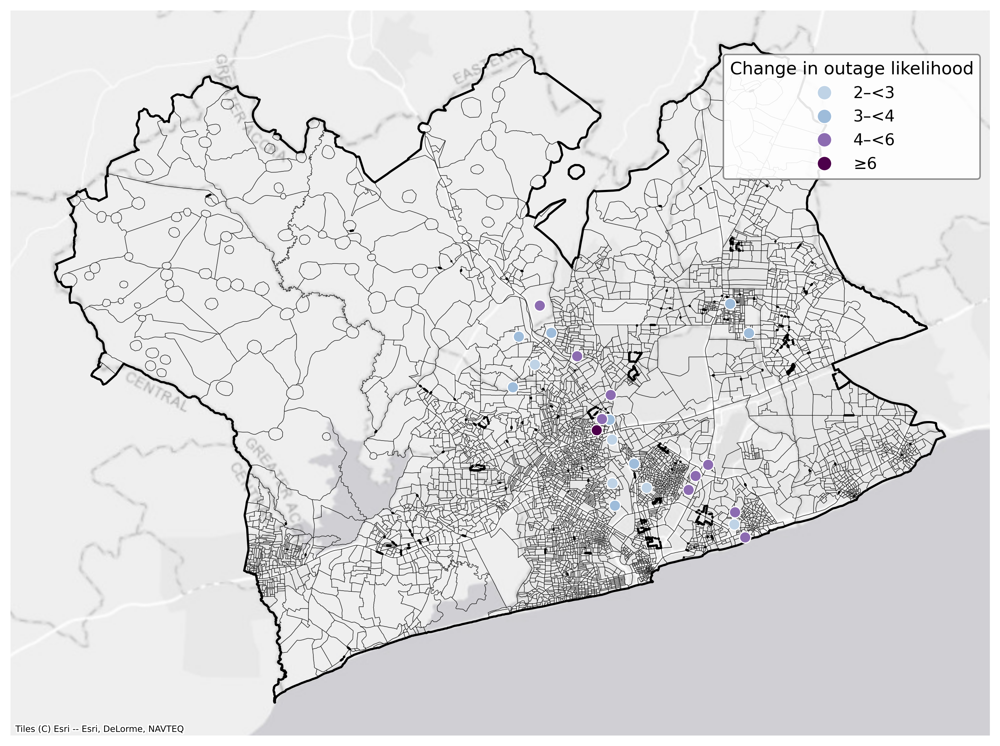

In [62]:
fig, ax, precipitation_centroids = (
    plot_same_day_outage_odds_categories_map(
        base_gdf=filt_all_eas_dem_df_filt,
        summary_df=same_day_summary_df,

        # Event and columns
        event='P',
        ea_col='ea_code9ch',
        event_col='event',
        odds_col='odds_ratio',

        # Odds-ratio categories
        odds_bins=(
            2,
            3,
            4,
            6,
            float('inf')
        ),
        odds_labels=(
            '2–<3',
            '3–<4',
            '4–<6',
            '≥6'
        ),
        odds_colors=odds_colors,

        # Figure
        figsize=fig_size,
        dpi=300,

        # Points
        point_size=60,
        point_alpha=1.0,
        point_marker='o',
        point_edgecolor='white',
        point_linewidth=0.8,

        # Individual EAs
        ea_facecolor='none',
        ea_alpha=0.60,
        ea_edgecolor='black',
        ea_linewidth=0.35,

        # Unionized EA boundary
        union_facecolor='none',
        union_alpha=1.0,
        union_edgecolor='black',
        union_linewidth=1.5,

        # Contextily basemap
        show_contextily=True,
        tile_source=ctx.providers.Esri.WorldGrayCanvas,
        tile_zoom='auto',
        tile_attribution=None,
        attribution_size=6,

        # Hide projected-coordinate axes
        show_axes=False,

        # Panel label
        panel_label=None,

        # Legend
        show_legend=True,
        legend_title='Change in outage likelihood',
        legend_title_fontsize=12,
        legend_loc='upper left',
        legend_bbox=(0.72, 0.95),
        legend_fontsize=11,
        legend_marker_size=10,
        legend_frame=True,
        legend_facecolor='white',
        legend_edgecolor='grey',
        legend_framealpha=0.9,

        # Diagnostics
        print_count=False,

        # Output
        # save_path=(
        #     PLOTS_DIR /
        #     'precipitation_outage_odds_categories_poster.png'
        # )
    )
)

In [63]:
odds_colors = {
    '2–<3': '#dadaeb',
    '3–<4': '#9e9ac8',
    '4–<6': '#756bb1',
    '≥6': '#3f007d'
}

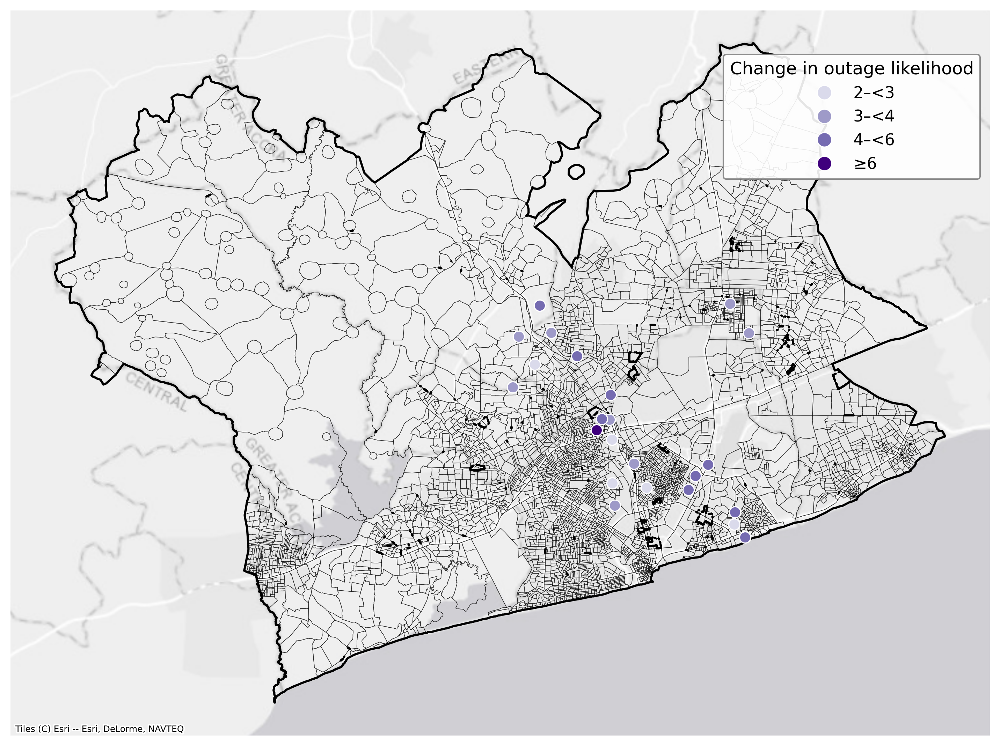

In [64]:
fig, ax, precipitation_centroids = (
    plot_same_day_outage_odds_categories_map(
        base_gdf=filt_all_eas_dem_df_filt,
        summary_df=same_day_summary_df,

        # Event and columns
        event='P',
        ea_col='ea_code9ch',
        event_col='event',
        odds_col='odds_ratio',

        # Odds-ratio categories
        odds_bins=(
            2,
            3,
            4,
            6,
            float('inf')
        ),
        odds_labels=(
            '2–<3',
            '3–<4',
            '4–<6',
            '≥6'
        ),
        odds_colors=odds_colors,

        # Figure
        figsize=fig_size,
        dpi=300,

        # Points
        point_size=60,
        point_alpha=1.0,
        point_marker='o',
        point_edgecolor='white',
        point_linewidth=0.8,

        # Individual EAs
        ea_facecolor='none',
        ea_alpha=0.60,
        ea_edgecolor='black',
        ea_linewidth=0.35,

        # Unionized EA boundary
        union_facecolor='none',
        union_alpha=1.0,
        union_edgecolor='black',
        union_linewidth=1.5,

        # Contextily basemap
        show_contextily=True,
        tile_source=ctx.providers.Esri.WorldGrayCanvas,
        tile_zoom='auto',
        tile_attribution=None,
        attribution_size=6,

        # Hide projected-coordinate axes
        show_axes=False,

        # Panel label
        panel_label=None,

        # Legend
        show_legend=True,
        legend_title='Change in outage likelihood',
        legend_title_fontsize=12,
        legend_loc='upper left',
        legend_bbox=(0.72, 0.95),
        legend_fontsize=11,
        legend_marker_size=10,
        legend_frame=True,
        legend_facecolor='white',
        legend_edgecolor='grey',
        legend_framealpha=0.9,

        # Diagnostics
        print_count=False,

        # Output
        # save_path=(
        #     PLOTS_DIR /
        #     'precipitation_outage_odds_categories_poster.png'
        # )
    )
)

In [65]:
odds_colors = {
    '2–<3': '#b3e5fc',
    '3–<4': '#4fc3f7',
    '4–<6': '#0288d1',
    '≥6': '#01579b'
}

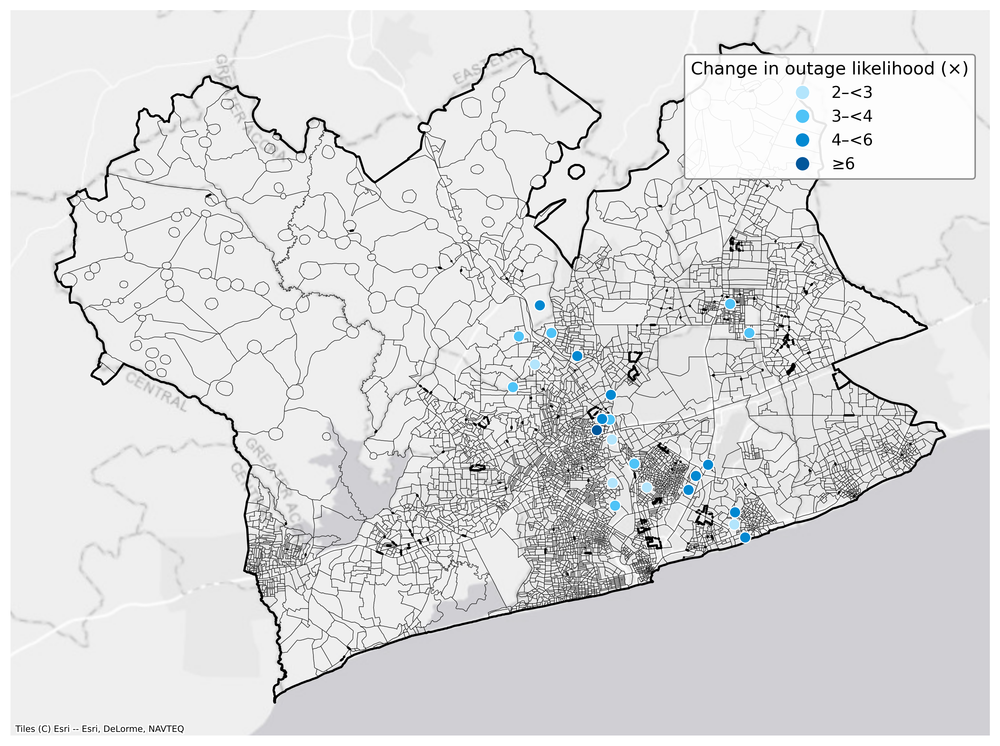

In [72]:
fig, ax, precipitation_centroids = (
    plot_same_day_outage_odds_categories_map(
        base_gdf=filt_all_eas_dem_df_filt,
        summary_df=same_day_summary_df,

        # Event and columns
        event='P',
        ea_col='ea_code9ch',
        event_col='event',
        odds_col='odds_ratio',

        # Odds-ratio categories
        odds_bins=(
            2,
            3,
            4,
            6,
            float('inf')
        ),
        odds_labels=(
            '2–<3',
            '3–<4',
            '4–<6',
            '≥6'
        ),
        odds_colors=odds_colors,

        # Figure
        figsize=fig_size,
        dpi=300,

        # Points
        point_size=60,
        point_alpha=1.0,
        point_marker='o',
        point_edgecolor='white',
        point_linewidth=0.8,

        # Individual EAs
        ea_facecolor='none',
        ea_alpha=0.60,
        ea_edgecolor='black',
        ea_linewidth=0.35,

        # Unionized EA boundary
        union_facecolor='none',
        union_alpha=1.0,
        union_edgecolor='black',
        union_linewidth=1.5,

        # Contextily basemap
        show_contextily=True,
        tile_source=ctx.providers.Esri.WorldGrayCanvas,
        tile_zoom='auto',
        tile_attribution=None,
        attribution_size=6,

        # Hide projected-coordinate axes
        show_axes=False,

        # Panel label
        panel_label=None,

        # Legend
        show_legend=True,
        legend_title='Change in outage likelihood (×)',
        legend_title_fontsize=12,
        legend_loc='upper left',
        legend_bbox=(0.68, 0.95),
        legend_fontsize=11,
        legend_marker_size=10,
        legend_frame=True,
        legend_facecolor='white',
        legend_edgecolor='grey',
        legend_framealpha=0.9,

        # Diagnostics
        print_count=False,

        # Output
        save_path=(
            PLOTS_DIR /
            'precipitation_outage_odds_categories_poster.png'
        )
    )
)